In [ ]:
!pip install torch torchvision transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

In [ ]:
!gdown --id 1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67
From (redirected): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67&confirm=t&uuid=907d12fb-f221-47dc-967a-cc87570435d2
To: /content/VQA.zip
100% 431M/431M [00:16<00:00, 26.4MB/s]


In [ ]:
!unzip /content/VQA.zip

Archive:  /content/VQA.zip
  inflating: dataset/all_qa_pairs.txt  
  inflating: dataset/answer_space.txt  
  inflating: dataset/data.csv        
  inflating: dataset/data_eval.csv   
  inflating: dataset/data_train.csv  
  inflating: dataset/images/image1.png  
  inflating: dataset/images/image10.png  
  inflating: dataset/images/image100.png  
  inflating: dataset/images/image1000.png  
  inflating: dataset/images/image1001.png  
  inflating: dataset/images/image1002.png  
  inflating: dataset/images/image1003.png  
  inflating: dataset/images/image1004.png  
  inflating: dataset/images/image1005.png  
  inflating: dataset/images/image1006.png  
  inflating: dataset/images/image1007.png  
  inflating: dataset/images/image1008.png  
  inflating: dataset/images/image1009.png  
  inflating: dataset/images/image101.png  
  inflating: dataset/images/image1010.png  
  inflating: dataset/images/image1011.png  
  inflating: dataset/images/image1012.png  
  inflating: dataset/images/image1013.

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 34.4 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.20.3
    Uninstalling huggingface-hub-0.20.3:
      Successfully uninstalled huggingface-hub-0.20.3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import os
from datasets import load_dataset
from transformers import BertTokenizer
class VQADataset(Dataset):
    def __init__(self, csv_file, image_folder, transform=None):
        # Load dataset from CSV
        self.data = pd.read_csv(csv_file)
        self.image_folder = image_folder
        self.transform = transform
        # Initialize the tokenizer
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        # Preprocess the dataset
        self.preprocess_dataset()

    def preprocess_dataset(self):
        # Load the dataset using the provided logic
        dataset = load_dataset(
            "csv",
            data_files={
                "train": os.path.join("dataset", "data_train.csv"),
                "test": os.path.join("dataset", "data_eval.csv")
            }
        )

        with open(os.path.join("dataset", "answer_space.txt")) as f:
            answer_space = f.read().splitlines()

        self.data = dataset.map(
            lambda examples: {
                'label': [
                    answer_space.index(ans.replace(" ", "").split(",")[0])  # Select the 1st answer if multiple answers are provided
                    for ans in examples['answer']
                ]
            },
            batched=True
        )

        # Convert dataset to DataFrame for easy indexing
        self.data = pd.DataFrame(self.data['train'])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        image_id = row['image_id']
        question = row['question']
        label = row['label']

        image_path = os.path.join(self.image_folder, f"{image_id}.png")
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        # Tokenize the question
        inputs = self.tokenizer(question, return_tensors='pt', padding='max_length', truncation=True, max_length=512)
        # Ensure the tensors are in the correct format for the DataLoader
        input_ids = inputs['input_ids'].squeeze(0)  # Remove batch dimension
        attention_mask = inputs['attention_mask'].squeeze(0)  # Remove batch dimension

        return image, input_ids, attention_mask, label



In [ ]:
# Example usage:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = VQADataset('dataset/data_train.csv', 'dataset/images', transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
val_dataset = VQADataset('dataset/data_eval.csv', 'dataset/images', transform)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/9974 [00:00<?, ? examples/s]

Map:   0%|          | 0/2494 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this Data

In [ ]:
import torch
import torch.nn as nn
from transformers import BertModel
from torchvision import models
from torch.cuda.amp import autocast, GradScaler
from torch.utils.checkpoint import checkpoint
from tqdm import tqdm
import matplotlib.pyplot as plt
import json

class VQAModel(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel, self).__init__()
        # Image feature extractor
        self.cnn = models.resnet50(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(2048 + 768, 1024)
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = checkpoint(self.cnn, images)  # Use checkpointing for ResNet

        # Extract question features
        outputs = checkpoint(self.bert, input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [ ]:
!wc -l dataset/answer_space.txt

581 dataset/answer_space.txt


# TRAINING #

In [ ]:
import torch.optim as optim
from torch.nn import CrossEntropyLoss

# Initialize the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel(num_answers=582)
model.to(device)

# Initialize the optimizer and GradScaler for mixed precision training
optimizer = optim.Adam(model.parameters(), lr=0.001)
scaler = GradScaler()

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Initialize metrics storage
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training parameters
num_epochs = 30
best_loss = float('inf')
best_model_state = None
patience = 4  # Number of epochs to wait for improvement before stopping
early_stopping_counter = 0


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 52.9MB/s]


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [45]:
def calculate_accuracy(outputs, labels):
    _, preds = torch.max(outputs, 1)
    correct = (preds == labels).sum().item()
    total = labels.size(0)
    return correct / total

In [ ]:
# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch")

    for images, input_ids, attention_mask, labels in progress_bar:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images, input_ids, attention_mask)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        accuracy = calculate_accuracy(outputs, labels)
        running_accuracy += accuracy

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = running_accuracy / len(train_loader)

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    model.eval()
    val_running_loss = 0.0
    val_running_accuracy = 0.0

    with torch.no_grad():
        val_progress_bar = tqdm(val_loader, desc="Validating", unit="batch")
        for images, input_ids, attention_mask, labels in val_progress_bar:
            images = images.to(device)
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            labels = labels.to(device)

            with torch.cuda.amp.autocast():
                outputs = model(images, input_ids, attention_mask)
                loss = criterion(outputs, labels)

            val_running_loss += loss.item()
            accuracy = calculate_accuracy(outputs, labels)
            val_running_accuracy += accuracy

    val_loss = val_running_loss / len(val_loader)
    val_accuracy = val_running_accuracy / len(val_loader)

    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss}, Training Accuracy: {epoch_accuracy}")
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Check if the validation loss improved
    if val_loss < best_loss:
        best_loss = val_loss
        best_model_state = model.state_dict()
        early_stopping_counter = 0  # Reset counter if we get a new best loss
        print(f"Saving model with lowest validation loss: {best_loss:.4f}")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler_state_dict': scaler.state_dict(),
            'best_loss': best_loss,
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_accuracies': train_accuracies,
            'val_accuracies': val_accuracies
        }, "/content/drive/MyDrive/best_model.pth")
    else:
        early_stopping_counter += 1
        print(f"No improvement in validation loss for {early_stopping_counter} epochs.")

    # Check for early stopping
    if early_stopping_counter >= patience:
        print("Early stopping triggered.")
        break

# Save the final metrics
metrics = {
    "train_losses": train_losses,
    "val_losses": val_losses,
    "train_accuracies": train_accuracies,
    "val_accuracies": val_accuracies
}

with open("/content/drive/MyDrive/training_metrics.json", "w") as f:
    json.dump(metrics, f)

Epoch 1/30:   0%|          | 0/156 [00:00<?, ?batch/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:460: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:90: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
Validating: 100%|██████████| 156/156 [02:29<00:00,  1.04batch/s]


Epoch 1/30, Training Loss: 5.149388337746645, Training Accuracy: 0.087150551994302
Validation Loss: 3.8509748730904017, Validation Accuracy: 0.18990755579297244
Saving model with lowest validation loss: 3.8510


Validating: 100%|██████████| 156/156 [02:30<00:00,  1.04batch/s]


Epoch 2/30, Training Loss: 4.222505766611833, Training Accuracy: 0.15770046889838557
Validation Loss: 3.25712949801714, Validation Accuracy: 0.25225546058879394
Saving model with lowest validation loss: 3.2571


Validating: 100%|██████████| 156/156 [02:29<00:00,  1.04batch/s]


Epoch 3/30, Training Loss: 3.8616489737461777, Training Accuracy: 0.18956255935422603
Validation Loss: 2.875713764092861, Validation Accuracy: 0.287448806980057
Saving model with lowest validation loss: 2.8757


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 4/30, Training Loss: 3.682146402505728, Training Accuracy: 0.20207146248812916
Validation Loss: 2.6397487337772665, Validation Accuracy: 0.33526976495726496
Saving model with lowest validation loss: 2.6397


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 5/30, Training Loss: 3.5464265835590854, Training Accuracy: 0.22736007241215575
Validation Loss: 2.5074724707847986, Validation Accuracy: 0.3411347044159544
Saving model with lowest validation loss: 2.5075


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 6/30, Training Loss: 3.4851043086785536, Training Accuracy: 0.23283920940170938
Validation Loss: 2.4234616183317623, Validation Accuracy: 0.37716642924976257
Saving model with lowest validation loss: 2.4235


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 7/30, Training Loss: 3.491408117306538, Training Accuracy: 0.24627923195631526
Validation Loss: 2.273716375613824, Validation Accuracy: 0.3993389423076923
Saving model with lowest validation loss: 2.2737


Validating: 100%|██████████| 156/156 [02:25<00:00,  1.07batch/s]


Epoch 8/30, Training Loss: 3.49263888444656, Training Accuracy: 0.247755668328585
Validation Loss: 2.32285232650928, Validation Accuracy: 0.3767732075023742


Validating: 100%|██████████| 156/156 [02:25<00:00,  1.07batch/s]


Epoch 9/30, Training Loss: 3.5007662635583143, Training Accuracy: 0.24739954297245964
Validation Loss: 2.1625089866992755, Validation Accuracy: 0.42105516975308643
Saving model with lowest validation loss: 2.1625


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.07batch/s]


Epoch 10/30, Training Loss: 3.422832586826422, Training Accuracy: 0.267105146011396
Validation Loss: 2.1484668858540363, Validation Accuracy: 0.4414433463912631
Saving model with lowest validation loss: 2.1485


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 11/30, Training Loss: 3.4051363116655593, Training Accuracy: 0.2769653668091168
Validation Loss: 2.2156991240305777, Validation Accuracy: 0.42478706671415


Validating: 100%|██████████| 156/156 [02:28<00:00,  1.05batch/s]


Epoch 12/30, Training Loss: 3.4813008659925218, Training Accuracy: 0.2726770239791073
Validation Loss: 2.2315127887786965, Validation Accuracy: 0.43253650284900286


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 13/30, Training Loss: 3.4205283400339956, Training Accuracy: 0.2859538224121558
Validation Loss: 2.01125860443482, Validation Accuracy: 0.4639608558879392
Saving model with lowest validation loss: 2.0113


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 14/30, Training Loss: 3.451569977479103, Training Accuracy: 0.2872262286324786
Validation Loss: 1.945558787156374, Validation Accuracy: 0.4732757597340931
Saving model with lowest validation loss: 1.9456


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 15/30, Training Loss: 3.437654586938711, Training Accuracy: 0.29260891500474834
Validation Loss: 2.090774422272658, Validation Accuracy: 0.4512664707977208


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 16/30, Training Loss: 3.4362717194434924, Training Accuracy: 0.29254585113960113
Validation Loss: 2.0658430327207613, Validation Accuracy: 0.4579401115859449


Validating: 100%|██████████| 156/156 [02:25<00:00,  1.07batch/s]


Epoch 17/30, Training Loss: 3.3800737124222975, Training Accuracy: 0.3059116809116809
Validation Loss: 2.299243159783192, Validation Accuracy: 0.4645061728395062


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 18/30, Training Loss: 3.436107011941763, Training Accuracy: 0.3019238188509022
Validation Loss: 2.1866532548879967, Validation Accuracy: 0.4533327397910731


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.07batch/s]


Epoch 19/30, Training Loss: 3.3481118312248817, Training Accuracy: 0.31650270061728397
Validation Loss: 1.771258464226356, Validation Accuracy: 0.5198057632953467
Saving model with lowest validation loss: 1.7713


Validating: 100%|██████████| 156/156 [02:28<00:00,  1.05batch/s]


Epoch 20/30, Training Loss: 3.3390625027509837, Training Accuracy: 0.3203718542260209
Validation Loss: 1.833068229449101, Validation Accuracy: 0.5042735042735043


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 21/30, Training Loss: 3.3641124337147446, Training Accuracy: 0.3176860754985755
Validation Loss: 2.1297449423716617, Validation Accuracy: 0.4726673789173789


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 22/30, Training Loss: 3.38636498267834, Training Accuracy: 0.3233321462488129
Validation Loss: 2.0506869852542877, Validation Accuracy: 0.49767034662868


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.07batch/s]


Epoch 23/30, Training Loss: 3.4114714020337815, Training Accuracy: 0.3238292378917379
Validation Loss: 1.8846035622633421, Validation Accuracy: 0.5150611348528015


Validating: 100%|██████████| 156/156 [02:28<00:00,  1.05batch/s]


Epoch 24/30, Training Loss: 3.384682071514619, Training Accuracy: 0.3258176044634378
Validation Loss: 1.9873603314925463, Validation Accuracy: 0.48770996557454893


Validating: 100%|██████████| 156/156 [02:27<00:00,  1.06batch/s]


Epoch 25/30, Training Loss: 3.4463097269718466, Training Accuracy: 0.33040642806267806
Validation Loss: 2.025173477637462, Validation Accuracy: 0.49811550332383664


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.07batch/s]


Epoch 26/30, Training Loss: 3.352376482425592, Training Accuracy: 0.3372729700854701
Validation Loss: 1.6393395394851, Validation Accuracy: 0.5493604582146249
Saving model with lowest validation loss: 1.6393


Validating: 100%|██████████| 156/156 [02:28<00:00,  1.05batch/s]


Epoch 27/30, Training Loss: 3.377440093419491, Training Accuracy: 0.3409343839031339
Validation Loss: 2.2476727863152823, Validation Accuracy: 0.47287511870845206


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 28/30, Training Loss: 3.4586564271877975, Training Accuracy: 0.33526976495726496
Validation Loss: 1.8417032674337044, Validation Accuracy: 0.5275069741215574


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]


Epoch 29/30, Training Loss: 3.350850979487101, Training Accuracy: 0.3428819444444445
Validation Loss: 1.9658608902723362, Validation Accuracy: 0.5059947768281102


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.06batch/s]

Epoch 30/30, Training Loss: 3.3586054077515235, Training Accuracy: 0.3454415954415954
Validation Loss: 1.876805251225447, Validation Accuracy: 0.5248582917853751


# PLOTTING #

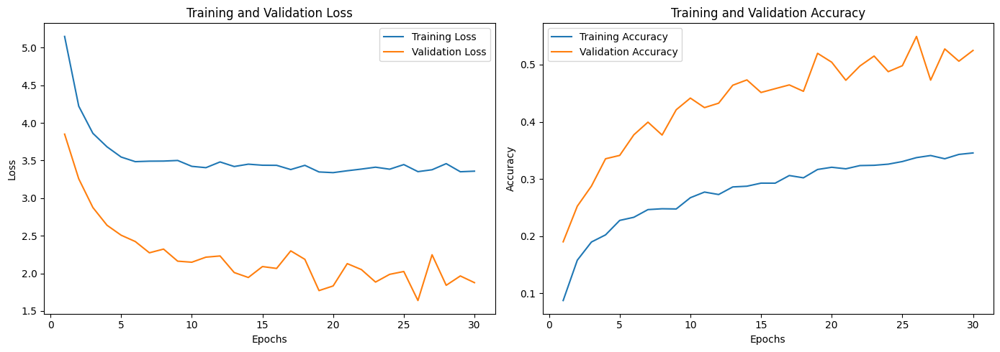

In [ ]:
# Load the saved metrics
with open("/content/drive/MyDrive/training_metrics.json", "r") as f:
    metrics = json.load(f)

train_losses = metrics["train_losses"]
val_losses = metrics["val_losses"]
train_accuracies = metrics["train_accuracies"]
val_accuracies = metrics["val_accuracies"]

# Plot the metrics
epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Training Accuracy')
plt.plot(epochs, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.tight_layout()
plt.show()


# TESTING #

In [40]:
class VQAModel1(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel1, self).__init__()
        # Image feature extractor
        self.cnn = models.resnet50(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(2048 + 768, 1024)
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = self.cnn(images)

        # Extract question features
        outputs = self.bert(input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [41]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel1(num_answers=582)  # Adjust num_answers based on your dataset
model.to(device)
# Load the best model checkpoint
checkpoint_path = "/content/drive/MyDrive/best_model.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint['model_state_dict'])

print("Best model loaded successfully.")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Best model loaded successfully.


In [42]:
from torch.utils.data import DataLoader
from torchvision import transforms

# Example usage
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = VQADataset('dataset/data_eval.csv', 'dataset/images', transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

print("Test data loader prepared successfully.")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Test data loader prepared successfully.


In [66]:
!pip install sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 3.8 MB/s eta 0:00:00


In [70]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sentence_transformers import SentenceTransformer, util

# Load Sentence-BERT model
model_sbert = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Function to calculate similarity using Sentence-BERT
def sbert_similarity(sentence1, sentence2):
    embeddings1 = model_sbert.encode(sentence1, convert_to_tensor=True)
    embeddings2 = model_sbert.encode(sentence2, convert_to_tensor=True)
    cosine_scores = util.pytorch_cos_sim(embeddings1, embeddings2)
    return cosine_scores.item()

In [71]:
def preprocess_answer(answer):
    # Remove underscores from the answer
    return answer.replace('_', ' ')

In [72]:
# Load answer space for mapping
with open(os.path.join("dataset", "answer_space.txt")) as f:
    answer_space = f.read().splitlines()

model.eval()
test_losses = []
test_accuracies = []
similarities = []

criterion = nn.CrossEntropyLoss()

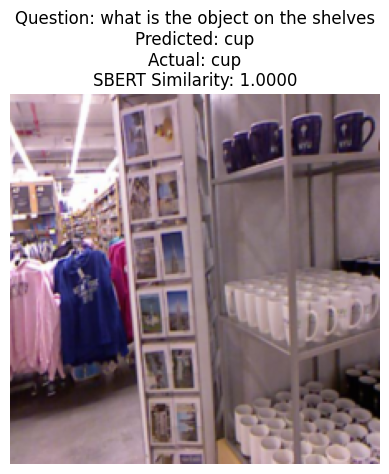

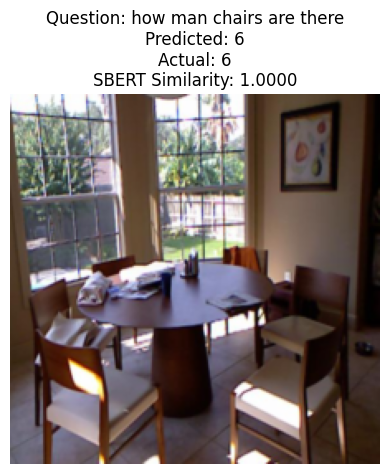

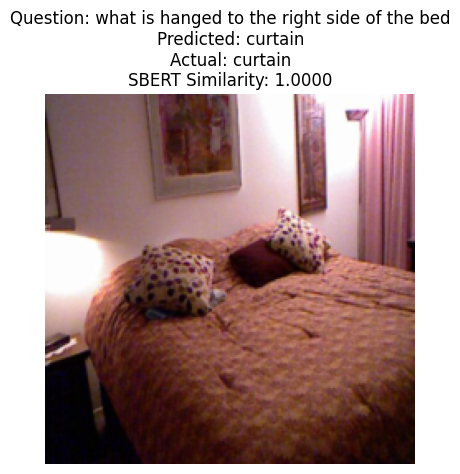

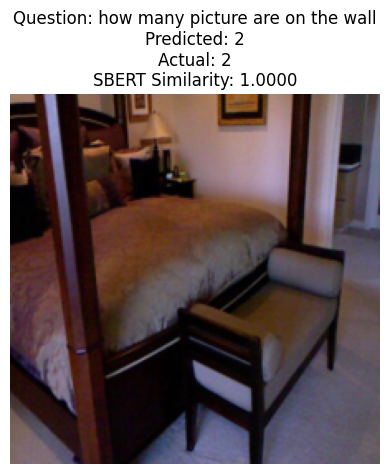

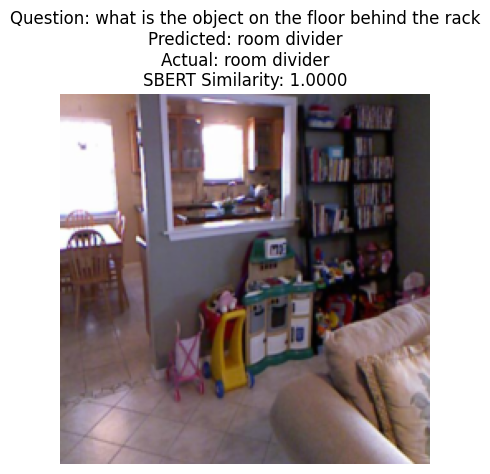

...

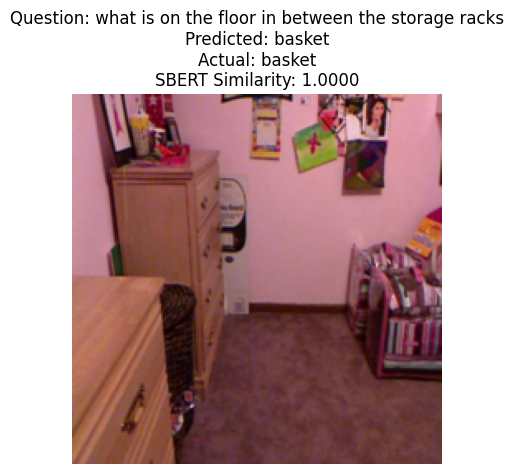

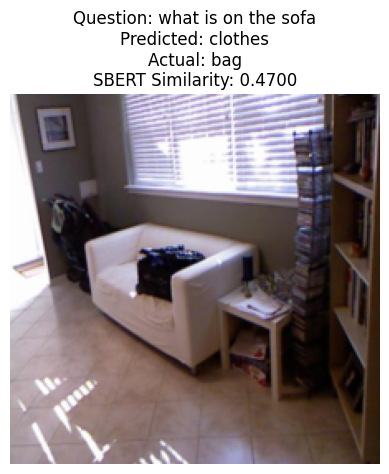

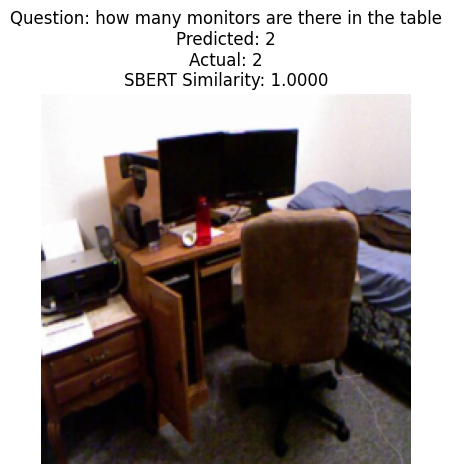

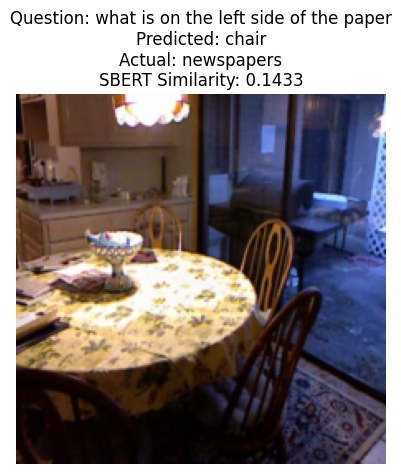

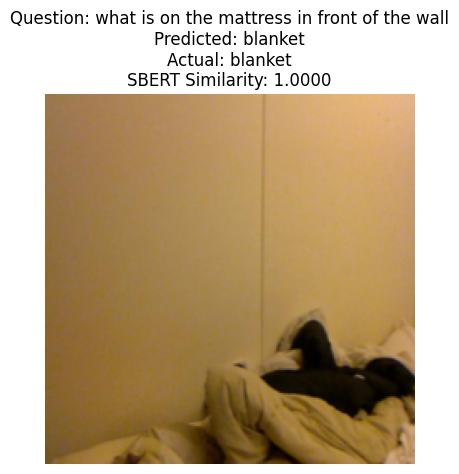

Average SBERT Similarity: 0.6608


In [73]:
with torch.no_grad():
    for idx, (images, input_ids, attention_mask, labels) in enumerate(test_loader):
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        outputs = model(images, input_ids, attention_mask)
        loss = criterion(outputs, labels)

        test_losses.append(loss.item())

        _, preds = torch.max(outputs, 1)
        accuracy = calculate_accuracy(outputs, labels)
        test_accuracies.append(accuracy)

        predicted_answer = preprocess_answer(answer_space[preds.item()])
        actual_answer = preprocess_answer(answer_space[labels.item()])

        similarity = sbert_similarity(predicted_answer, actual_answer)
        similarities.append(similarity)

        # Plotting the image with question and answers
        image = images.cpu().squeeze().permute(1, 2, 0).numpy()
        image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)

        plt.imshow(image)
        plt.title(f"Question: {test_dataset.data.iloc[idx]['question']}\nPredicted: {predicted_answer}\nActual: {actual_answer}\nSBERT Similarity: {similarity:.4f}")
        plt.axis('off')
        plt.show()

        if idx >= 49:  # Display only 50 samples
            break

# Print average similarity score
average_similarity = np.mean(similarities)
print(f"Average SBERT Similarity: {average_similarity:.4f}")

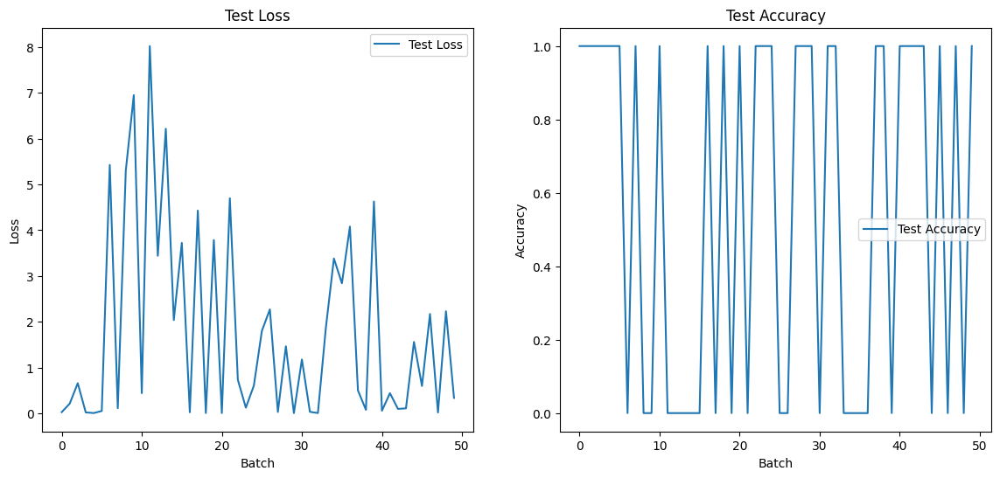

In [85]:
# Plot test accuracy and test loss
plt.figure(figsize=(14, 6))

# Test Loss
plt.subplot(1, 2, 1)
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.title('Test Loss')
plt.legend()

# Test Accuracy
plt.subplot(1, 2, 2)
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Batch')
plt.ylabel('Accuracy')
plt.title('Test Accuracy')
plt.legend()

plt.show()

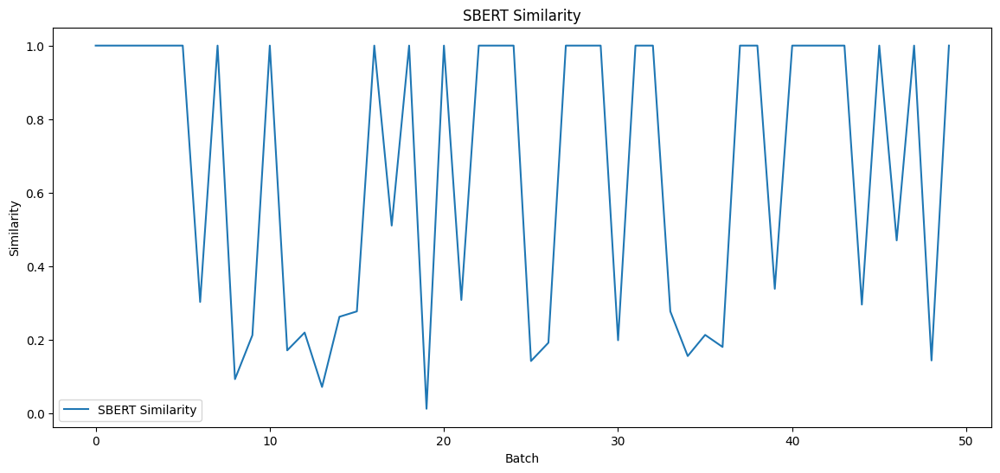

In [93]:
# Similarity
plt.figure(figsize=(14, 6))
plt.subplot(1, 1, 1)
plt.plot(similarities, label='SBERT Similarity')
plt.xlabel('Batch')
plt.ylabel('Similarity')
plt.title('SBERT Similarity')
plt.legend()
plt.show()